In [4]:
import os
from glob import glob

base_dir = '../data/Related work from Rowan/new_dataset/original/'
txt_files = glob(f"{base_dir}/*/*.txt")
# remove classes.txt
txt_files = [f for f in txt_files if 'classes.txt' not in f]
print(len(txt_files))
img_files = [f.replace('.txt', '.png') for f in txt_files]
classes = list(set([os.path.basename(os.path.dirname(f)) for f in txt_files]))
classes.sort()
print(classes)
print(img_files[:5], txt_files[:5])

318
['2', 'Anafi', 'EXOII', 'F11GIM', 'FPV', 'HS110G', 'HS720E', 'Inspire1', 'KY601S', 'Mavic2Pro', 'Mavic3', 'MavicAir', 'MavicMini4', 'MavicPro', 'Mini3', 'Phantom4', 'PhantomAdv3', 'Tello', 'X4', 'Xstar']
['../data/Related work from Rowan/new_dataset/original/F11GIM/sample_0.png', '../data/Related work from Rowan/new_dataset/original/F11GIM/sample_1.png', '../data/Related work from Rowan/new_dataset/original/F11GIM/sample_10.png', '../data/Related work from Rowan/new_dataset/original/F11GIM/sample_100.png', '../data/Related work from Rowan/new_dataset/original/F11GIM/sample_101.png'] ['../data/Related work from Rowan/new_dataset/original/F11GIM/sample_0.txt', '../data/Related work from Rowan/new_dataset/original/F11GIM/sample_1.txt', '../data/Related work from Rowan/new_dataset/original/F11GIM/sample_10.txt', '../data/Related work from Rowan/new_dataset/original/F11GIM/sample_100.txt', '../data/Related work from Rowan/new_dataset/original/F11GIM/sample_101.txt']


# Find annotated files

In [13]:
meta_file = '../data/Related work from Rowan/new_dataset/original/all_meta_data.json'
import json
with open(meta_file, 'r') as f:
    meta_data = json.load(f)
    
# This script assumes 'meta_data' is your list of dictionaries loaded from JSON.

unique_meta_data = []
seen_spect_paths = set()

for sample in meta_data:
    # Get the value of the key that should be unique.
    # Using .get() is safer in case the key is missing from a record.
    spect_path = sample.get('spect_path')
    
    # If the path is valid and we haven't seen it before...
    if spect_path and spect_path not in seen_spect_paths:
        # ...add the path to our set of seen paths...
        seen_spect_paths.add(spect_path)
        # ...and add the entire sample to our new list.
        unique_meta_data.append(sample)

print(f"Original meta_data length: {len(meta_data)}")
print(f"Length after removing duplicates by 'spect_path': {len(unique_meta_data)}")

# You can now overwrite the old list with the de-duplicated one for future use
meta_data = unique_meta_data

Original meta_data length: 11678
Length after removing duplicates by 'spect_path': 5173


In [14]:
img_short_names = [f'{os.path.sep}'.join(img_file.split(os.path.sep)[-2:]) for img_file in img_files]
img_short_names = list(set(img_short_names))  # Remove duplicates
annotation_samples = []
print(len(img_short_names), len(meta_data))
for sample in meta_data:
    if sample['spect_path'] in img_short_names:
        copy_sample = sample.copy()
        copy_sample['original_file_path'] = copy_sample['original_file_path'][3:]
        annotation_samples.append(copy_sample)

print(f"Found {len(annotation_samples)} samples in the metadata that match the image files.")
# annotation_samples

318 5173
Found 318 samples in the metadata that match the image files.


# yolo dataset fixes

In [15]:
# Let's inspect the content of the first text file to understand its format.
# This helps verify that the labels are in the correct YOLO format.
first_txt_file = txt_files[284]

print(f"--- Inspecting file: {first_txt_file} ---")


with open(first_txt_file, 'r') as f:
    lines = f.readlines()
    
new_lines = []
for line in lines:
    parts = line.strip().split()
    if len(parts) > 0:
        class_index = int(parts[0])
        # Change class index according to the new order in 'classes'
        if class_index >16:
            new_class_index = class_index - 2
            parts[0] = str(new_class_index)
        new_lines.append(" ".join(parts))
        print(f"Original line: {line.strip()} -> New line: {' '.join(parts)}")

print("------------------------------------")

--- Inspecting file: ../data/Related work from Rowan/new_dataset/original/Tello/sample_0.txt ---
Original line: 19 0.500292 0.500488 0.999417 0.999023 -> New line: 17 0.500292 0.500488 0.999417 0.999023
------------------------------------


In [16]:
import os
import shutil
import random
from collections import defaultdict

# --- Configuration ---
# This script assumes 'img_files' and 'txt_files' lists are already populated.

# 1. Set the path for the new, split dataset.
output_dir = '../dataset/yolo_detection_dataset/'

# 2. Set the training data ratio.
train_ratio = 0.8

# --- Script ---

# Ensure the output directory is clean
if os.path.exists(output_dir):
    shutil.rmtree(output_dir)

# Create the required directory structure for YOLO Object Detection
train_images_path = os.path.join(output_dir, 'images', 'train')
train_labels_path = os.path.join(output_dir, 'labels', 'train')
val_images_path = os.path.join(output_dir, 'images', 'val')
val_labels_path = os.path.join(output_dir, 'labels', 'val')

os.makedirs(train_images_path, exist_ok=True)
os.makedirs(train_labels_path, exist_ok=True)
os.makedirs(val_images_path, exist_ok=True)
os.makedirs(val_labels_path, exist_ok=True)

print(f"Created object detection directory structure at: {output_dir}")

# Group files by class
data_by_class = defaultdict(list)
for img_path, txt_path in zip(img_files, txt_files):
    # Assumes the class name is the name of the parent directory
    class_name = os.path.basename(os.path.dirname(img_path))
    data_by_class[class_name].append((img_path, txt_path))

# Keep track of total file counts
total_train_count = 0
total_val_count = 0

# Process each class to perform a balanced split and rename files
for class_name, files in data_by_class.items():
    random.shuffle(files)
    split_index = int(len(files) * train_ratio)
    train_set = files[:split_index]
    val_set = files[split_index:]
    
    print(f"\nProcessing class: {class_name}")
    print(f"  Splitting {len(files)} samples into {len(train_set)} training and {len(val_set)} validation.")
    
    # --- Copy and rename training files ---
    for i, (img_path, txt_path) in enumerate(train_set):
        
        img_extension = os.path.splitext(img_path)[1]
        filename = os.path.splitext(os.path.basename(img_path))[0]
        new_filename_stem = f"{class_name}_{filename}"
        os.makedirs(os.path.join(train_images_path, class_name), exist_ok=True)
        os.makedirs(os.path.join(train_labels_path, class_name), exist_ok=True)
        
        # Copy and rename image
        if os.path.exists(img_path):
            dest_img_path = os.path.join(train_images_path, class_name, f"{new_filename_stem}{img_extension}")
            shutil.copy(img_path, dest_img_path)
            
        # Copy and rename label
        if os.path.exists(txt_path):
            dest_txt_path = os.path.join(train_labels_path, class_name, f"{new_filename_stem}.txt")
            shutil.copy(txt_path, dest_txt_path)
            
    # --- Copy and rename validation files ---
    for i, (img_path, txt_path) in enumerate(val_set):
        img_extension = os.path.splitext(img_path)[1]
        filename = os.path.splitext(os.path.basename(img_path))[0]
        new_filename_stem = f"{class_name}_{filename}"
        os.makedirs(os.path.join(val_images_path, class_name), exist_ok=True)
        os.makedirs(os.path.join(val_labels_path, class_name), exist_ok=True)

        # Copy and rename image
        if os.path.exists(img_path):
            dest_img_path = os.path.join(val_images_path, class_name, f"{new_filename_stem}{img_extension}")
            shutil.copy(img_path, dest_img_path)

        # Copy and rename label
        if os.path.exists(txt_path):
            dest_txt_path = os.path.join(val_labels_path, class_name, f"{new_filename_stem}.txt")
            shutil.copy(txt_path, dest_txt_path)
            
    total_train_count += len(train_set)
    total_val_count += len(val_set)

print("\n--------------------")
print("Object detection dataset splitting complete.")
print(f"Total training samples copied: {total_train_count}")
print(f"Total validation samples copied: {total_val_count}")
print(f"Dataset saved to: {output_dir}")
print("--------------------")

Created object detection directory structure at: ../dataset/yolo_detection_dataset/

Processing class: F11GIM
  Splitting 16 samples into 12 training and 4 validation.

Processing class: KY601S
  Splitting 16 samples into 12 training and 4 validation.

Processing class: HS720E
  Splitting 14 samples into 11 training and 3 validation.

Processing class: X4
  Splitting 17 samples into 13 training and 4 validation.

Processing class: 2
  Splitting 14 samples into 11 training and 3 validation.

Processing class: HS110G
  Splitting 15 samples into 12 training and 3 validation.

Processing class: Anafi
  Splitting 14 samples into 11 training and 3 validation.

Processing class: Xstar
  Splitting 16 samples into 12 training and 4 validation.

Processing class: EXOII
  Splitting 16 samples into 12 training and 4 validation.


KeyboardInterrupt: 

In [ ]:
# change classes indexes
label_files = glob(f"{output_dir}/labels/*/*/*.txt")
label_files

for file_path in label_files:
    with open(file_path, 'r') as f:
        lines = f.readlines()
    
    new_lines = []
    for line in lines:
        parts = line.strip().split()
        if len(parts) > 0:
            class_index = int(parts[0])
            if class_index >16:
                new_class_index = class_index - 2
                parts[0] = str(new_class_index)
        new_lines.append(" ".join(parts) + "\n")
    
    with open(file_path, 'w') as f:
        f.writelines(new_lines)

In [ ]:
# Create the dictionary with the dataset configuration using index-to-class mapping
dataset_yaml_content = {
    'path': os.path.abspath(output_dir),
    'train': 'images/train',  # Use relative paths
    'val': 'images/val',
    'nc': len(classes),
    'names': {
        0: '2',
        1: 'Anafi',
        2: 'EXOII',
        3: 'F11GIM',
        4: 'FPV',
        5: 'HS110G',
        6: 'HS720E',
        7: 'Inspire1',
        8: 'KY601S',
        9: 'Mavic2Pro',
        10: 'Mavic3',
        11: 'MavicAir',
        12: 'MavicMini4',
        13: 'MavicPro',
        14: 'Mini3',
        15: 'Phantom4',
        16: 'PhantomAdv3',
        17: 'Tello',
        18: 'X4',
        19: 'Xstar',
    }
}

# Path where the dataset.yaml will be saved
dataset_yaml_path = os.path.join(output_dir, 'dataset.yaml')

# Write the dictionary to the YAML file
with open(dataset_yaml_path, 'w') as f:
    yaml.dump(dataset_yaml_content, f, sort_keys=False)

print(f"Successfully created '{dataset_yaml_path}'")
print("\n--- File Content ---")
with open(dataset_yaml_path, 'r') as f:
    print(f.read())
print("--------------------")
print("\nYou can now use this 'dataset.yaml' file as the 'data' argument for your YOLO training.")

# yolo training

In [1]:
# In a new Jupyter Notebook cell:
# Import necessary libraries
import ultralytics
from ultralytics import YOLO
import os
import yaml

# Check Ultralytics version
ultralytics.checks()

Ultralytics 8.3.156 🚀 Python-3.10.0 torch-2.7.1+cu126 CUDA:0 (NVIDIA GeForce RTX 4090, 24564MiB)
Setup complete ✅ (32 CPUs, 108.1 GB RAM, 478.5/1006.9 GB disk)


In [2]:
model = YOLO('yolo11n.pt') # Using yolov11n as an example

# Define training parameters
# You can adjust these as needed
epochs = 50  # Number of training epochs
img_size = 640 # Input image size
batch_size = 16 # Batch size (adjust based on your GPU memory)
project_name = 'yolo11n'
experiment_name = 'roboflow-2025-07-29'  # Name of the experiment

dataset_yaml_path = '/mnt/d/Rowan/AeroDefence/dataset/Roboflow-2025-07-29/data.yaml'

# Train the model
# The 'data' argument should be the path to your 'dataset.yaml'
results = model.train(
    data=dataset_yaml_path,  # Use the absolute path
    epochs=epochs,
    imgsz=img_size,
    batch=batch_size,
    project=project_name,
    name=experiment_name,
    patience=10, # Epochs to wait for no observable improvement before stopping training early
    # device=0 # Uncomment to specify GPU device, e.g., 0 for the first GPU. 'cpu' for CPU.
    # workers=8 # Number of worker threads for data loading (adjust based on your system)
)

print("Training completed.")
print(f"Results saved to: {results}")

New https://pypi.org/project/ultralytics/8.3.170 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.156 🚀 Python-3.10.0 torch-2.7.1+cu126 CUDA:0 (NVIDIA GeForce RTX 4090, 24564MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/mnt/d/Rowan/AeroDefence/dataset/Roboflow-2025-07-29/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=rob

train: Scanning /mnt/d/Rowan/AeroDefence/dataset/Roboflow-2025-07-29/train/labels.cache... 1000 images, 82 backgrounds, 0 corrupt: 100%|██████████| 1000/1000 [00:00<?, ?it/s]


val: Fast image access ✅ (ping: 2.1±0.7 ms, read: 32.5±10.4 MB/s, size: 382.8 KB)


val: Scanning /mnt/d/Rowan/AeroDefence/dataset/Roboflow-2025-07-29/valid/labels.cache... 188 images, 16 backgrounds, 0 corrupt: 100%|██████████| 188/188 [00:00<?, ?it/s]


Plotting labels to yolo11n/roboflow-2025-07-29/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000323, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to yolo11n/roboflow-2025-07-29
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.25G     0.9932      4.305      1.404         25        640: 100%|██████████| 63/63 [00:06<00:00,  9.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00, 11.08it/s]

                   all        188        184     0.0365     0.0601     0.0593     0.0513     0.0178     0.0409     0.0153



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      2.38G     0.5073      3.301       1.09         24        640: 100%|██████████| 63/63 [00:04<00:00, 12.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  9.74it/s]

                   all        188        184      0.967     0.0938       0.25      0.198      0.124      0.183      0.065



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.38G     0.4667      2.495      1.045         24        640: 100%|██████████| 63/63 [00:04<00:00, 12.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  8.95it/s]

                   all        188        184      0.792      0.335       0.38      0.237      0.192      0.258      0.152



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.39G     0.4348      1.985      1.016         17        640: 100%|██████████| 63/63 [00:04<00:00, 12.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  8.97it/s]

                   all        188        184      0.716      0.454      0.508      0.423      0.327      0.408       0.23



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.41G     0.3981      1.628     0.9864         22        640: 100%|██████████| 63/63 [00:04<00:00, 12.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  9.45it/s]

                   all        188        184      0.672      0.581        0.6      0.494      0.376      0.481      0.293



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.41G     0.3733      1.414     0.9809         21        640: 100%|██████████| 63/63 [00:04<00:00, 13.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  8.37it/s]

                   all        188        184      0.732      0.575      0.678        0.6      0.521      0.586      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.44G     0.3508      1.252     0.9592         26        640: 100%|██████████| 63/63 [00:04<00:00, 12.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  9.24it/s]

                   all        188        184      0.678      0.614      0.728      0.546      0.451      0.568      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      2.45G     0.3373      1.149     0.9534         20        640: 100%|██████████| 63/63 [00:04<00:00, 12.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  9.22it/s]

                   all        188        184      0.714      0.693      0.787      0.652      0.559      0.657      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      2.45G     0.3254      1.046     0.9506         18        640: 100%|██████████| 63/63 [00:04<00:00, 12.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  8.99it/s]

                   all        188        184      0.736      0.746      0.832      0.713      0.563      0.702      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      2.45G     0.3121     0.9501     0.9304         20        640: 100%|██████████| 63/63 [00:04<00:00, 12.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  8.89it/s]

                   all        188        184      0.727      0.819      0.858      0.739      0.587      0.736      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      2.45G     0.3052     0.8773     0.9338         23        640: 100%|██████████| 63/63 [00:04<00:00, 13.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  9.12it/s]

                   all        188        184       0.81      0.811       0.87       0.79      0.571      0.744      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      2.45G     0.2982     0.8364     0.9381         26        640: 100%|██████████| 63/63 [00:04<00:00, 12.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  8.49it/s]

                   all        188        184      0.728      0.817      0.871      0.802      0.689      0.774      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      2.45G     0.2955     0.8023     0.9255         20        640: 100%|██████████| 63/63 [00:04<00:00, 12.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  8.34it/s]

                   all        188        184      0.854      0.741      0.884      0.782      0.609      0.757      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      2.45G     0.2805     0.7763     0.9188         25        640: 100%|██████████| 63/63 [00:05<00:00, 12.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  9.10it/s]

                   all        188        184      0.919      0.818      0.905      0.844      0.694      0.801      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      2.45G     0.2802      0.759      0.921         23        640: 100%|██████████| 63/63 [00:05<00:00, 11.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  7.77it/s]

                   all        188        184      0.872      0.799      0.896      0.819      0.623      0.767      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      2.45G     0.2855     0.7068     0.9263         24        640: 100%|██████████| 63/63 [00:05<00:00, 12.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  7.99it/s]

                   all        188        184       0.77      0.797      0.849      0.736      0.602      0.713      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      2.45G      0.277     0.6876     0.9292         19        640: 100%|██████████| 63/63 [00:05<00:00, 12.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  9.40it/s]

                   all        188        184      0.745      0.842      0.851      0.753      0.612      0.732      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      2.45G     0.2743     0.6705     0.9218         20        640: 100%|██████████| 63/63 [00:04<00:00, 13.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  9.42it/s]

                   all        188        184      0.795      0.873      0.911      0.841      0.714      0.804      0.593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      2.45G     0.2689     0.6658     0.9144         16        640: 100%|██████████| 63/63 [00:04<00:00, 12.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  8.34it/s]

                   all        188        184      0.695      0.898      0.906      0.879      0.762      0.831      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      2.46G     0.2559     0.6393     0.9117         19        640: 100%|██████████| 63/63 [00:04<00:00, 13.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  9.85it/s]


                   all        188        184      0.756      0.901      0.889      0.795      0.607      0.757      0.526

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      2.46G     0.2453     0.6076     0.9071         19        640: 100%|██████████| 63/63 [00:04<00:00, 13.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00, 10.25it/s]

                   all        188        184      0.849       0.91      0.922      0.833      0.678      0.797      0.579



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      2.46G     0.2563     0.5898     0.9169         22        640: 100%|██████████| 63/63 [00:04<00:00, 13.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  9.51it/s]

                   all        188        184      0.776      0.805      0.906      0.818        0.7      0.798      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      2.46G     0.2508     0.5905     0.9067         20        640: 100%|██████████| 63/63 [00:04<00:00, 13.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  9.02it/s]

                   all        188        184       0.83      0.895      0.914      0.862      0.675      0.806      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      2.46G     0.2375     0.5675      0.903         19        640: 100%|██████████| 63/63 [00:04<00:00, 13.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  9.34it/s]

                   all        188        184      0.853      0.875      0.916      0.829      0.696        0.8      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      2.46G     0.2334     0.5437     0.8997         23        640: 100%|██████████| 63/63 [00:04<00:00, 13.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  8.83it/s]

                   all        188        184      0.835        0.9      0.912      0.792      0.706      0.804      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      2.46G     0.2375     0.5447      0.893         17        640: 100%|██████████| 63/63 [00:04<00:00, 13.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  9.82it/s]


                   all        188        184      0.833      0.903      0.927      0.851      0.684      0.814      0.586

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      2.46G     0.2453     0.5397     0.9125         26        640: 100%|██████████| 63/63 [00:04<00:00, 13.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00, 10.26it/s]

                   all        188        184        0.9       0.89      0.934      0.873      0.758      0.848      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      2.46G     0.2357     0.5354     0.9058         19        640: 100%|██████████| 63/63 [00:04<00:00, 14.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  9.53it/s]


                   all        188        184      0.799      0.918      0.934       0.85      0.732      0.834      0.634

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      2.46G     0.2313     0.5263     0.9008         21        640: 100%|██████████| 63/63 [00:04<00:00, 13.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  9.53it/s]

                   all        188        184       0.78      0.929      0.924      0.887      0.714       0.83      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      2.46G      0.217     0.5005     0.8934         23        640: 100%|██████████| 63/63 [00:04<00:00, 13.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  9.80it/s]


                   all        188        184      0.874      0.881      0.925      0.883      0.696      0.828      0.609

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      2.46G     0.2217     0.4873     0.8871         28        640: 100%|██████████| 63/63 [00:04<00:00, 13.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  9.76it/s]

                   all        188        184       0.74      0.904      0.909      0.844      0.661      0.793      0.566



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      2.46G     0.2177     0.4792     0.8934         21        640: 100%|██████████| 63/63 [00:04<00:00, 13.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  9.86it/s]

                   all        188        184       0.76      0.821      0.886      0.825      0.659      0.777      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      2.46G      0.218     0.4813     0.8968         19        640: 100%|██████████| 63/63 [00:04<00:00, 13.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00, 10.07it/s]

                   all        188        184      0.849      0.847      0.914      0.845      0.727      0.813      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      2.46G     0.2127     0.4555     0.8944         28        640: 100%|██████████| 63/63 [00:04<00:00, 13.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  9.65it/s]

                   all        188        184       0.84      0.914      0.932      0.847      0.731       0.83      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      2.46G     0.2104      0.456     0.8936         26        640: 100%|██████████| 63/63 [00:04<00:00, 12.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  9.37it/s]

                   all        188        184      0.835      0.877      0.922      0.847      0.691      0.819      0.611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      2.46G     0.2039      0.442     0.8791         26        640: 100%|██████████| 63/63 [00:04<00:00, 13.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00, 10.31it/s]

                   all        188        184      0.768      0.902      0.919      0.849      0.731      0.816      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      2.46G      0.204      0.437     0.8891         20        640: 100%|██████████| 63/63 [00:04<00:00, 13.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  9.57it/s]

                   all        188        184      0.878      0.908      0.931      0.885      0.762      0.844       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      2.46G     0.2072     0.4368     0.8941         23        640: 100%|██████████| 63/63 [00:04<00:00, 13.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  9.82it/s]

                   all        188        184       0.86      0.863       0.92      0.868      0.761      0.838      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      2.46G     0.2087     0.4273     0.8881         25        640: 100%|██████████| 63/63 [00:04<00:00, 13.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  9.87it/s]

                   all        188        184      0.867      0.877      0.921      0.855      0.742      0.828      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      2.46G     0.2065      0.438      0.894         25        640: 100%|██████████| 63/63 [00:04<00:00, 13.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  9.20it/s]

                   all        188        184      0.872      0.884      0.918      0.857      0.749      0.834      0.659


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      2.46G     0.2367     0.7728     0.9312          8        640: 100%|██████████| 63/63 [00:05<00:00, 12.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  9.50it/s]

                   all        188        184      0.898      0.878      0.929      0.853      0.756      0.833      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      2.46G     0.1927     0.5835     0.8917          7        640: 100%|██████████| 63/63 [00:04<00:00, 13.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00, 10.08it/s]

                   all        188        184      0.866      0.888      0.923      0.865      0.795       0.85      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      2.46G     0.1852     0.5421       0.88          8        640: 100%|██████████| 63/63 [00:04<00:00, 13.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  9.36it/s]

                   all        188        184       0.87      0.906      0.923      0.891      0.764      0.851      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      2.46G     0.1803     0.5317     0.8789          7        640: 100%|██████████| 63/63 [00:04<00:00, 14.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00, 10.09it/s]

                   all        188        184      0.911      0.897      0.935      0.893      0.801      0.859      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      2.46G     0.1793     0.5187     0.8787          8        640: 100%|██████████| 63/63 [00:04<00:00, 13.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  9.76it/s]

                   all        188        184      0.908      0.902      0.913       0.86      0.751      0.836      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      2.46G       0.17     0.5043     0.8776          9        640: 100%|██████████| 63/63 [00:04<00:00, 14.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  9.49it/s]

                   all        188        184      0.864      0.918      0.932      0.856      0.806      0.841      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      2.46G     0.1701     0.4881     0.8839          8        640: 100%|██████████| 63/63 [00:04<00:00, 13.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00, 10.03it/s]

                   all        188        184      0.888      0.894      0.929      0.856       0.79      0.843      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      2.46G     0.1683     0.4914     0.8744          8        640: 100%|██████████| 63/63 [00:04<00:00, 14.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  9.76it/s]

                   all        188        184      0.876      0.915      0.931      0.849      0.748      0.839      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      2.46G     0.1703     0.4796     0.8848          7        640: 100%|██████████| 63/63 [00:04<00:00, 13.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  9.01it/s]

                   all        188        184      0.896      0.897      0.931       0.87      0.778      0.846      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      2.46G     0.1628     0.4729     0.8704          8        640: 100%|██████████| 63/63 [00:04<00:00, 13.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:00<00:00,  9.09it/s]

                   all        188        184      0.882      0.924      0.933      0.878      0.784      0.852      0.708



50 epochs completed in 0.080 hours.
Optimizer stripped from yolo11n/roboflow-2025-07-29/weights/last.pt, 5.5MB
Optimizer stripped from yolo11n/roboflow-2025-07-29/weights/best.pt, 5.5MB

Validating yolo11n/roboflow-2025-07-29/weights/best.pt...
Ultralytics 8.3.156 🚀 Python-3.10.0 torch-2.7.1+cu126 CUDA:0 (NVIDIA GeForce RTX 4090, 24564MiB)
YOLO11n summary (fused): 100 layers, 2,587,417 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50      mAP75      mAP90   mAP50-95   mAP90-95: 100%|██████████| 6/6 [00:01<00:00,  5.94it/s]


                   all        188        184      0.911      0.897      0.936      0.894      0.798      0.859      0.695
           Autel_EXOII          5          5      0.952          1      0.995      0.995      0.995       0.94      0.722
           Autel_Xstar          3          3      0.932          1      0.995      0.995      0.995      0.995      0.995
               DJI_FPV         18         18      0.921          1      0.995      0.995      0.995      0.988      0.961
          DJI_Inspire1          4          4      0.944          1      0.995      0.995      0.995      0.995      0.995
          DJI_Inspire2          3          3       0.93          1      0.995      0.995      0.995      0.995      0.995
         DJI_Mavic2Pro         13         13          1       0.97      0.995      0.995      0.995      0.995      0.995
            DJI_Mavic3         19         19      0.986          1      0.995      0.995      0.995      0.986      0.951
          DJI_MavicAir  

In [5]:
base_path = '../data/Relate work from AeroDefense/Data/Raw data/Rowan_05222025/'
patterns = [f'{base_path}*.dat', f'{base_path}*{os.sep}*.dat']
dat_files = []
[dat_files.extend(glob(pattern)) for pattern in patterns]
dat_files

['../data/Relate work from AeroDefense/Data/Raw data/Rowan_05222025/DJI_3Drone_10_2426.dat',
 '../data/Relate work from AeroDefense/Data/Raw data/Rowan_05222025/DJI_4Drone_10_2426.dat',
 '../data/Relate work from AeroDefense/Data/Raw data/Rowan_05222025/DJI_MavicFPV_Mavic2_10_24xx_2406.dat']

(1715, 1024)


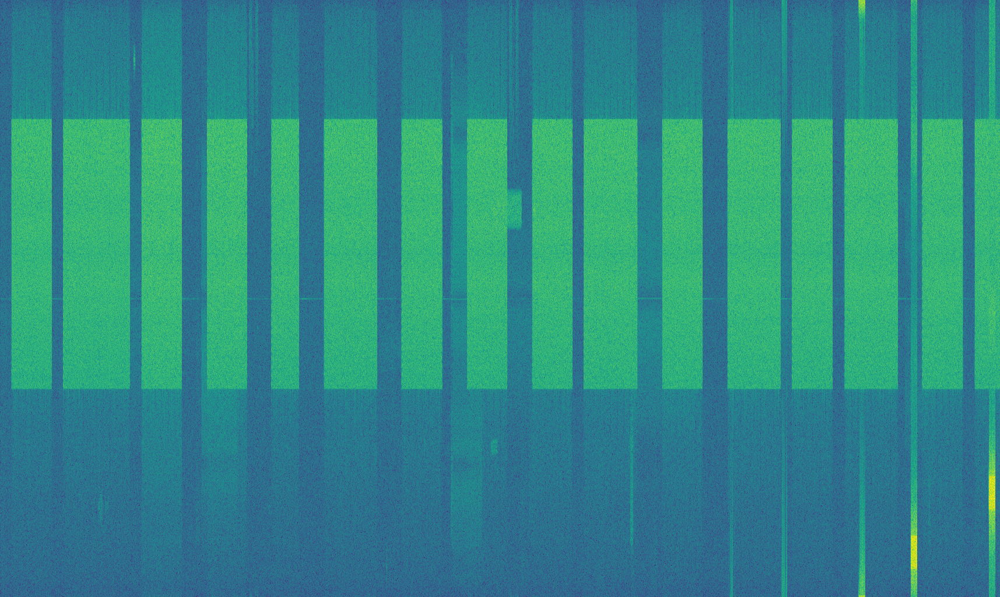

In [11]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import stft, ShortTimeFFT, get_window

from PIL import Image


i = 50
step= 1000

FFT_SIZE = 1024
NUM_FFT_SPEC = 1500
SAMPLING_RATE = 20e6

signal = np.memmap(dat_files[2], dtype=np.complex64, mode='r')

signal_sample = signal[int(i*SAMPLING_RATE):int((i+step)*SAMPLING_RATE)]
corrected_sample = signal_sample[:NUM_FFT_SPEC*FFT_SIZE]

w = get_window('hann', FFT_SIZE)
SFT = ShortTimeFFT(w, hop=int(FFT_SIZE-128), fs=SAMPLING_RATE, scale_to='magnitude', fft_mode='centered')

stft_matrix = SFT.stft(corrected_sample)  
# _,_, stft_matrix = stft(corrected_sample, fs=SAMPLING_RATE, nperseg=FFT_SIZE, noverlap=128, window='hann', return_onesided=False)
# stft_matrix = np.fft.fftshift(stft_matrix, axes=0)

spectrum = np.abs(stft_matrix) ** 2
spectrum_db = 10 * np.log10(spectrum + 1e-12)

norm_spectrum: np.ndarray = (spectrum_db - np.min(spectrum_db)) / (np.max(spectrum_db) - np.min(spectrum_db))

norm_spectrum = norm_spectrum[:]

rgba_img: np.ndarray = plt.get_cmap('viridis')(norm_spectrum)
alpha = rgba_img[..., 3:]       # shape (H, W, 1)
rgb_channels = rgba_img[..., :3]     # shape (H, W, 3), floats in [0,1]
bg_color = np.ones_like(rgb_channels)    # white background (1,1,1)

# composite
color_img = rgb_channels * alpha + bg_color * (1 - alpha)

rgb_image_uint8 = (color_img * 255).astype(np.uint8)
pil_image = Image.fromarray(rgb_image_uint8, 'RGB')
print(pil_image.size)
pil_image

In [12]:
pred = model.predict(source=pil_image, show=False, save=True, conf=0.25, save_txt=False, project='yolo/predictions', name='inference_results', exist_ok=True, stream=False)


0: 384x640 1 DJI_FPV, 17.9ms
Speed: 4.0ms preprocess, 17.9ms inference, 3.3ms postprocess per image at shape (1, 3, 384, 640)
Results saved to yolo/predictions/inference_results


In [15]:
pred[0].boxes

ultralytics.engine.results.Boxes object with attributes:

cls: tensor([2.], device='cuda:0')
conf: tensor([0.9508], device='cuda:0')
data: tensor([[0.0000e+00, 2.0432e+02, 1.7145e+03, 6.7165e+02, 9.5084e-01, 2.0000e+00]], device='cuda:0')
id: None
is_track: False
orig_shape: (1024, 1715)
shape: torch.Size([1, 6])
xywh: tensor([[ 857.2258,  437.9839, 1714.4517,  467.3358]], device='cuda:0')
xywhn: tensor([[0.4998, 0.4277, 0.9997, 0.4564]], device='cuda:0')
xyxy: tensor([[   0.0000,  204.3160, 1714.4517,  671.6519]], device='cuda:0')
xyxyn: tensor([[0.0000, 0.1995, 0.9997, 0.6559]], device='cuda:0')

# wifi

In [ ]:
base_path = '../data/Relate work from AeroDefense/Data/Raw data/SR20M_G50_cage_RT15/Non-drone'
patterns = [f'{base_path}*.dat', f'{base_path}*{os.sep}*.dat']
dat_files = []
[dat_files.extend(glob(pattern)) for pattern in patterns]
dat_files

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import stft
from PIL import Image


i = 7
images = []
for i in range(0, 18, 2):
    
    step= 1000

    FFT_SIZE = 1024
    NUM_FFT_SPEC = 1500
    SAMPLING_RATE = 20e6

    signal = np.memmap(dat_files[2], dtype=np.complex64, mode='r')

    signal_sample = signal[int(i*SAMPLING_RATE):int((i+step)*SAMPLING_RATE)]
    corrected_sample = signal_sample[:NUM_FFT_SPEC*FFT_SIZE]

    _,_, stft_matrix = stft(corrected_sample, fs=SAMPLING_RATE, nperseg=FFT_SIZE, noverlap=128, window='hann', return_onesided=False)
    stft_matrix = np.fft.fftshift(stft_matrix, axes=0)

    spectrum = np.abs(stft_matrix) ** 2
    spectrum_db = 10 * np.log10(spectrum + 1e-12)

    norm_spectrum: np.ndarray = (spectrum_db - np.min(spectrum_db)) / (np.max(spectrum_db) - np.min(spectrum_db))

    rgba_img: np.ndarray = plt.get_cmap('viridis')(norm_spectrum)
    alpha = rgba_img[..., 3:]       # shape (H, W, 1)
    rgb_channels = rgba_img[..., :3]     # shape (H, W, 3), floats in [0,1]
    bg_color = np.ones_like(rgb_channels)    # white background (1,1,1)

    # composite
    color_img = rgb_channels * alpha + bg_color * (1 - alpha)

    rgb_image_uint8 = (color_img * 255).astype(np.uint8)
    pil_image = Image.fromarray(rgb_image_uint8, 'RGB')
    images.append(pil_image)


In [ ]:
model = YOLO('./yolo/run1/weights/best.pt') # Using yolov11n as an example
pred = model.predict(source=images, show=False, save=True, conf=0.25, save_txt=False, project='yolo/predictions', name='inference_results', exist_ok=True, stream=False)

In [ ]:
model = YOLO('./yolo/run1/weights/best.pt') # Using yolov11n as an example
pred = model.predict(source=pil_image, show=False, save=True, conf=0.25, save_txt=False, project='yolo/predictions', name='inference_results', exist_ok=True, stream=False)

# new dataset

In [9]:
import numpy as np
import matplotlib.pyplot as plt
import scipy as sp
from scipy.signal import stft, butter, lfilter
from scipy.ndimage import median_filter, gaussian_filter1d
# from skimage.restoration import denoise_nl_means
from PIL import Image
from src.yolo.augment_annotations import load_and_truncate_signal, get_centered_stft_matrix, normalize_complex_signal,frequency_normalize_spectrogram,time_normalize_spectrogram,minmax_normalize_spectrogram,power_normalize,z_normalize_complex,frequency_shift_signal


def find_signal_mask(spectrum_db: np.ndarray,) -> np.ndarray:
    # 1. Estimate the noise profile by averaging power over time for each frequency bin.
    #    Using the median is often more robust to strong, short signals than the mean.
    time_window_size = 251  # Number of time bins to average over
    noise_profile_db = median_filter(spectrum_db, size=(1, time_window_size), mode='reflect')
    # noise_profile_db = np.median(spectrum_db, axis=1, keepdims=True)

    # 2. Subtract the noise profile from the spectrogram.
    #    Add a small margin (e.g., 3 dB) to avoid removing weak signals.
    margin_db = 5.0
    signal_mask = spectrum_db > (noise_profile_db + margin_db)

    # 4. Calculate gain based on SNR
    snr = spectrum_db - noise_profile_db
    threshold = 5.0  # dB, similar to your margin
    slope = 1.0      # Controls how sharp the transition is
    gain = 1 / (1 + np.exp(-(snr - threshold) * slope))

    return signal_mask, gain, noise_profile_db

def apply_spectral_gating(spectrum_db):
    # 1. Estimate noise profile
    time_window_size = 251
    noise_profile_db = median_filter(spectrum_db, size=(1, time_window_size), mode='reflect')
    
    # 2. Calculate signal-to-noise ratio for each time-frequency bin
    snr = spectrum_db - noise_profile_db
    
    # 3. Apply a soft sigmoidal gating function instead of hard thresholding
    threshold = 5.0  # dB, similar to your margin
    slope = 1.0      # Controls how sharp the transition is
    gain = 1 / (1 + np.exp(-(snr - threshold) * slope))
    
    # 4. Apply the time-frequency varying gain
    enhanced_spectrum = spectrum_db * gain
    
    return enhanced_spectrum

def get_adaptive_threshold(noise_profile, sensitivity=1.5):
    # Calculate standard deviation across time for each frequency
    noise_std = np.std(noise_profile, axis=1, keepdims=True)
    # Threshold adapts to local noise variability
    return noise_profile + sensitivity * noise_std


def apply_nlm_denoising(spectrum):
    # Normalize for NLM algorithm
    norm_spec = (spectrum - np.min(spectrum)) / (np.max(spectrum) - np.min(spectrum))
    # Apply non-local means denoising
    denoised = denoise_nl_means(norm_spec, patch_size=5, patch_distance=7, h=0.1)
    # Scale back to original range
    return denoised * (np.max(spectrum) - np.min(spectrum)) + np.min(spectrum)

def isolate_drone_signals(spectrum_db):
    # 1. First pass with basic noise removal
    time_window_size = 251
    noise_profile_db = median_filter(spectrum_db, size=(1, time_window_size), mode='reflect')

    # 2. Calculate signal-to-noise ratio for each time-frequency bin
    snr = spectrum_db - noise_profile_db
    
    # 3. Look for characteristic drone spectral patterns (concentrated energy bands)
    # For example, detect horizontal lines in the spectrogram
    horizontal_detector = gaussian_filter1d(spectrum_db - noise_profile_db, 
                                                   sigma=3, axis=1)
    
    # 4. Apply a stronger filter to non-drone regions
    # print(np.min(horizontal_detector), np.max(horizontal_detector))
    drone_mask = horizontal_detector > 3.0
    enhanced = np.copy(spectrum_db)

    # # 4. Apply a soft sigmoidal gating function instead of hard thresholding
    # threshold = 5.0  # dB, similar to your margin
    # slope = 1.0      # Controls how sharp the transition is
    # gain = 1 / (1 + np.exp(-(snr - threshold) * slope))

    # enhanced *= gain
    enhanced[~drone_mask] = np.minimum(spectrum_db[~drone_mask], noise_profile_db[~drone_mask])
    
    return enhanced

def get_spectrogram_from_meta_data(
     sample_1, sample_2: dict,
    spectrogram_normalize, signal_normalize, shift_amount_hz=None,
    signal_weight=0.6,
    color_map_name='viridis') -> Image:
    """
    Generates a spectrogram image from signal data, allowing for slicing
    a specific frequency band.

    Args:
        meta_data (dict): Dictionary containing signal metadata.
    """

    # spectrogram_normalize = minmax_normalize_spectrogram
    # signal_normalize = power_normalize

    corrected_sample_1 = load_and_truncate_signal(sample_1)
    corrected_sample_2 = load_and_truncate_signal(sample_2)

    if shift_amount_hz is not None:
        # --- APPLY FREQUENCY SHIFT ---
        # Example: Shift the first signal up by 1 MHz
        corrected_sample_1 = frequency_shift_signal(
            corrected_sample_1, 
            shift_hz=shift_amount_hz, 
            sampling_rate=sample_1['sampling_rate']
        )
        # --- END SHIFT ---

    corrected_sample_1 = signal_normalize(corrected_sample_1)
    corrected_sample_2 = signal_normalize(corrected_sample_2)


    corrected_sample_1 =  corrected_sample_1 + corrected_sample_2*signal_weight
    corrected_sample_1 = signal_normalize(corrected_sample_1)



    # # --- Filtering Example: Apply a Low-Pass Filter ---
    # # This is a common step to remove high-frequency noise.
    # # We will design a 5th-order Butterworth filter with a 5 MHz cutoff.
    # cutoff_freq = 5e4  # 5 MHz
    # nyquist = 0.5 * SAMPLING_RATE
    # normal_cutoff = cutoff_freq / nyquist
    # b, a = butter(5, normal_cutoff, btype='low', analog=False)
    # corrected_sample = lfilter(b, a, corrected_sample)

    # --- STFT Calculation ---
    stft_matrix_1 = get_centered_stft_matrix(corrected_sample_1, sample_1['sampling_rate'], sample_1['fft_size'])
    # stft_matrix_2 = get_centered_stft_matrix(corrected_sample_2, sample_2['sampling_rate'], sample_2['fft_size'])

    # --- Image Generation (from the sliced matrix) ---
    spectrum_1 = np.abs(stft_matrix_1) ** 2
    spectrum_db_1 = 10 * np.log10(spectrum_1 + 1e-12)

    # spectrum_2 = np.abs(stft_matrix_2) ** 2
    # spectrum_db_2 = 10 * np.log10(spectrum_2 + 1e-12)

    # # Normalize the sliced spectrum to create the image
    norm_spectrum_1: np.ndarray = spectrogram_normalize(spectrum_db_1)
    # norm_spectrum_2: np.ndarray = spectrogram_normalize(spectrum_db_2)

    # # --- FILTERING: SPECTRAL SUBTRACTION ---
    # # 1. Find the signal mask by estimating the noise profile.
    signal_mask_1, gain_1, noise_profile_db_1 = find_signal_mask(spectrum_db_1)
    # signal_mask_2, gain_2, noise_profile_db_2 = find_signal_mask(spectrum_db_2)

    # 2. Any values below zero (i.e., below the noise floor) are clipped.
    # norm_spectrum_2[signal_mask_2] *= 0.7
    # modified_spectrum_db_1 = isolate_drone_signals(norm_spectrum_1)
    # modified_spectrum_db_1 = np.copy(norm_spectrum_1)
    # # modified_spectrum_db_1[signal_mask_1] *= gain_1
    # modified_spectrum_db_1[~signal_mask_1] = np.minimum(norm_spectrum_1[~signal_mask_1], noise_profile_db_1[~signal_mask_1])

    # modified_spectrum_db_1[signal_mask_1] += signal_gain_db

    # modified_spectrum_db_2 = isolate_drone_signals(norm_spectrum_2)
    # modified_spectrum_db_2 = np.copy(norm_spectrum_2)
    # modified_spectrum_db_2[signal_mask_2] *= gain_2
    # modified_spectrum_db_2[~signal_mask_2] = np.minimum(norm_spectrum_2[~signal_mask_2], noise_profile_db_2[~signal_mask_2])

    # final_spectrum = (modified_spectrum_db_1 + modified_spectrum_db_2*2)
    # # --- END FILTERING ---

    final_spectrum = norm_spectrum_1
    # final_spectrum = modified_spectrum_db_1
    # final_spectrum = modified_spectrum_db_2
    # final_spectrum = isolate_drone_signals(norm_spectrum_1) + 2*isolate_drone_signals(norm_spectrum_2)

    # # Normalize the sliced spectrum to create the image
    final_spectrum: np.ndarray = spectrogram_normalize(final_spectrum)


    rgba_img: np.ndarray = plt.get_cmap(color_map_name)(final_spectrum)
    alpha = rgba_img[..., 3:]       # shape (H, W, 1)
    rgb_channels = rgba_img[..., :3]     # shape (H, W, 3), floats in [0,1]
    bg_color = np.ones_like(rgb_channels)    # white background (1,1,1)

    # composite
    color_img = rgb_channels * alpha + bg_color * (1 - alpha)

    rgb_image_uint8 = (color_img * 255).astype(np.uint8)
    pil_image = Image.fromarray(rgb_image_uint8, 'RGB')
    print(pil_image.size)
    return pil_image

In [ ]:
spectrogram_normalizes = [minmax_normalize_spectrogram, frequency_normalize_spectrogram, time_normalize_spectrogram]
signal_normalizes = [normalize_complex_signal, power_normalize, z_normalize_complex]
get_spectrogram_from_meta_data(master_meta[0], None, spectrogram_normalize=spectrogram_normalizes[0], shift_amount_hz=5e6, signal_normalize=signal_normalizes[0])

# Normalize comparison

In [ ]:
spectrogram_normalizes = [minmax_normalize_spectrogram, frequency_normalize_spectrogram, time_normalize_spectrogram]
signal_normalizes = [normalize_complex_signal, power_normalize, z_normalize_complex]

for spectrogram_normalize in spectrogram_normalizes:
    for signal_normalize in signal_normalizes:
        print(f"Processing with {spectrogram_normalize.__name__} and {signal_normalize.__name__}")
        # Generate a spectrogram image from the first two samples
        img = get_spectrogram_from_meta_data(annotation_samples[140], annotation_samples[130], spectrogram_normalize=spectrogram_normalize, signal_normalize=signal_normalize)
        # Display the image
        # This code assumes it's running in a single cell context where the loops are present.
        # It uses global variables to maintain the state of the plot across loop iterations.
        fig1, axes1 = plt.subplots(1, 1, figsize=(18, 13))
        axes1.imshow(img)
        axes1.set_title(f"Spec: {spectrogram_normalize.__name__}\nSig: {signal_normalize.__name__}", fontsize=10)
        axes1.axis('off')

        # Determine the current position in the 3x3 grid
        row = spectrogram_normalizes.index(spectrogram_normalize)
        col = signal_normalizes.index(signal_normalize)

        # On the first iteration, create the figure and axes for the grid
        if row == 0 and col == 0:
            global fig, axes
            fig, axes = plt.subplots(3, 3, figsize=(18, 13))
            # fig.suptitle('Spectrogram Normalization Combinations', fontsize=16)

        # Display the current image in its designated subplot
        axes[row, col].imshow(img)
        axes[row, col].set_title(f"Spec: {spectrogram_normalize.__name__}\nSig: {signal_normalize.__name__}", fontsize=10)
        axes[row, col].axis('off')

        # On the last iteration, adjust the layout and show the complete grid
        if row == len(spectrogram_normalizes) - 1 and col == len(signal_normalizes) - 1:
            plt.tight_layout(rect=[0, 0, 1, 0.96])
            plt.show()

# Frequency Shift

In [ ]:
spectrogram_normalize = minmax_normalize_spectrogram
signal_normalize = normalize_complex_signal
shift_amount_hz = [-4e6, -3e6, -2e6, -1e6, 1e6, 2e6, 3e6, 4e6, 5e6]
for i, fq in enumerate(shift_amount_hz):
        print(f"Processing with {fq} Hz shift")
        # Generate a spectrogram image from the first two samples
        img = get_spectrogram_from_meta_data(annotation_samples[140], annotation_samples[130], spectrogram_normalize=spectrogram_normalize, signal_normalize=signal_normalize, shift_amount_hz=fq)

        # It uses global variables to maintain the state of the plot across loop iterations.
        fig1, axes1 = plt.subplots(1, 1, figsize=(18, 12))
        axes1.imshow(img)
        axes1.set_title(f"Shift: {fq} Hz", fontsize=10)
        axes1.axis('off')

        # Determine the current position in the 3x3 grid
        row = i // 3
        col = i % 3

        # On the first iteration, create the figure and axes for the grid
        if row == 0 and col == 0:
            global fig, axes
            fig, axes = plt.subplots(len(shift_amount_hz) // 3, 3, figsize=(18, 13))
            # fig.suptitle('Spectrogram Normalization Combinations', fontsize=16)

        # Display the current image in its designated subplot
        axes[row, col].imshow(img)
        axes[row, col].set_title(f"Shift: {fq} Hz", fontsize=10)
        axes[row, col].axis('off')

        # On the last iteration, adjust the layout and show the complete grid
        if row == len(shift_amount_hz) // 3 and col == len(shift_amount_hz) % 3:
            plt.tight_layout(rect=[0, 0, 1, 0.96])
            plt.show()

# Color Maps

In [ ]:
spectrogram_normalize = minmax_normalize_spectrogram
signal_normalize = normalize_complex_signal
shift_amount_hz = 4e6
for i, cmap in enumerate(plt.colormaps()[:9]):
        print(f"Processing with {cmap} color map")
        # Generate a spectrogram image from the first two samples
        img = get_spectrogram_from_meta_data(annotation_samples[140], annotation_samples[130], spectrogram_normalize=spectrogram_normalize, signal_normalize=signal_normalize, shift_amount_hz=shift_amount_hz, color_map_name=cmap)

        # It uses global variables to maintain the state of the plot across loop iterations.
        fig1, axes1 = plt.subplots(1, 1, figsize=(18, 12))
        axes1.imshow(img)
        axes1.set_title(f"color: {cmap} Hz", fontsize=10)
        axes1.axis('off')

        # Determine the current position in the 3x3 grid
        row = i // 3
        col = i % 3

        # On the first iteration, create the figure and axes for the grid
        if row == 0 and col == 0:
            global fig, axes
            fig, axes = plt.subplots(9 // 3, 3, figsize=(18, 13))
            # fig.suptitle('Spectrogram Normalization Combinations', fontsize=16)

        # Display the current image in its designated subplot
        axes[row, col].imshow(img)
        axes[row, col].set_title(f"color: {cmap} Hz", fontsize=10)
        axes[row, col].axis('off')

        # On the last iteration, adjust the layout and show the complete grid
        if row == 9 // 3 and col == 9 % 3:
            plt.tight_layout(rect=[0, 0, 1, 0.96])
            plt.show()

# bboxes

In [ ]:
import matplotlib.patches as patches

def calculate_shifted_y_center(y_center_norm, shift_hz, sampling_rate, fft_size, img_height):
    """
    Calculates the new normalized y-center for a bounding box after a frequency shift.
    """
    # Calculate how many pixels the frequency shift corresponds to.
    pixel_shift = (shift_hz * fft_size) / sampling_rate
    
    # Convert normalized y-center to pixel coordinates
    y_center_pixels = y_center_norm * img_height
    
    # Apply the shift. A positive shift moves to a higher frequency, which is DOWN in the image.
    new_y_center_pixels = y_center_pixels + pixel_shift
    
    # Convert back to normalized coordinates
    new_y_center_norm = new_y_center_pixels / img_height
    
    return new_y_center_norm

def get_annotations(sample_info):
    model_name, sample_index = sample_info['spect_path'].split(os.path.sep)
    sample_index, _ = os.path.splitext(sample_index)
    annotate_path = os.path.join('../dataset/yolo_detection_dataset/labels/val', model_name, f"{model_name}_{sample_index}.txt")
    annotations = []
    if os.path.exists(annotate_path):
        with open(annotate_path, 'r') as f:
            annotations = f.readlines()
        print(f"Loaded {len(annotations)} annotation(s) for {model_name} from {annotate_path}")
    else:
        print(f"Annotation file not found at: {annotate_path}")
    return annotations

spectrogram_normalize = minmax_normalize_spectrogram
signal_normalize = normalize_complex_signal
shift_amount_hz = 6e6

# --- 1. Generate the spectrogram image ---
sample_shifted = annotation_samples[140]  # This one will be shifted
sample_stationary = annotation_samples[130] # This one will stay put
# --- Load annotations for both samples ---
annotations_shifted = get_annotations(sample_shifted)
annotations_stationary = get_annotations(sample_stationary)


img = get_spectrogram_from_meta_data(sample_shifted, sample_stationary, spectrogram_normalize=spectrogram_normalize, signal_normalize=signal_normalize, shift_amount_hz=shift_amount_hz)

# --- Add a class name mapping dictionary ---
class_names = {
    0: '2', 1: 'Anafi', 2: 'EXOII', 3: 'F11GIM', 4: 'FPV', 5: 'HS110G',
    6: 'HS720E', 7: 'Inspire1', 8: 'KY601S', 9: 'Mavic2Pro', 10: 'Mavic3',
    11: 'MavicAir', 12: 'MavicMini4', 13: 'MavicPro', 14: 'Mini3', 15: 'Phantom4',
    16: 'PhantomAdv3', 17: 'Tello', 18: 'X4', 19: 'Xstar'
}


# --- 3. Draw the image and the bounding boxes ---
fig, ax = plt.subplots(1, 1, figsize=(18, 12))
ax.imshow(img)
ax.set_title(f"Overlay Spectrogram with Annotations (Shift: {shift_amount_hz} Hz)", fontsize=10)
ax.axis('off')

# Get image dimensions for coordinate conversion
img_width, img_height = img.size

# --- Draw boxes for the STATIONARY signal (Blue) ---
if annotations_stationary:
    for line in annotations_stationary:
        class_id, x_center, y_center, width, height = map(float, line.strip().split())
        class_name = class_names.get(int(class_id), "Unknown")
        box_width_px = width * img_width
        box_height_px = height * img_height
        x_min_px = (x_center * img_width) - (box_width_px / 2)
        y_min_px = (y_center * img_height) - (box_height_px / 2)
        
        rect = patches.Rectangle(
            (x_min_px, y_min_px), box_width_px, box_height_px,
            linewidth=2, edgecolor='red', facecolor='none'
        )
        ax.add_patch(rect)
        ax.text(x_min_px, y_min_px - 5, class_name, color='red', fontsize=12,
                bbox=dict(facecolor='white', alpha=0.5, edgecolor='none', pad=1))

# --- Draw boxes for the SHIFTED signal (Original in Red, Shifted in Green) ---
if annotations_shifted:
    for line in annotations_shifted:
        class_id, x_center, y_center, width, height = map(float, line.strip().split())
        class_name = class_names.get(int(class_id), "Unknown")
        box_width_px = width * img_width
        box_height_px = height * img_height
        x_min_px = (x_center * img_width) - (box_width_px / 2)
        y_min_px_orig = (y_center * img_height) - (box_height_px / 2)
        
        # This box is not drawn as it corresponds to the pre-shift position
        # on a different spectrogram. We only draw the final, shifted box.

        # --- CALCULATE SHIFT AND DRAW NEW BOX(ES) (GREEN) ---
        pixel_shift = (shift_amount_hz * sample_shifted['fft_size']) / sample_shifted['sampling_rate']
        new_y_min_px = y_min_px_orig + pixel_shift
        new_y_max_px = new_y_min_px + box_height_px

        # Handle wrap-around logic and draw the green box(es)
        if new_y_min_px >= 0 and new_y_max_px <= img_height:
            shifted_rect = patches.Rectangle((x_min_px, new_y_min_px), box_width_px, box_height_px, linewidth=2, edgecolor='lime', facecolor='none')
            ax.add_patch(shifted_rect)
            ax.text(x_min_px, new_y_min_px - 5, class_name, color='lime', fontsize=12, bbox=dict(facecolor='white', alpha=0.5, edgecolor='none', pad=1))
        elif new_y_max_px > img_height:
            height1 = img_height - new_y_min_px
            if height1 > 0:
                ax.add_patch(patches.Rectangle((x_min_px, new_y_min_px), box_width_px, height1, linewidth=2, edgecolor='lime', facecolor='none'))
                ax.text(x_min_px, new_y_min_px - 5, class_name, color='lime', fontsize=12, bbox=dict(facecolor='white', alpha=0.5, edgecolor='none', pad=1))
            height2 = new_y_max_px - img_height
            if height2 > 0:
                ax.add_patch(patches.Rectangle((x_min_px, 0), box_width_px, height2, linewidth=2, edgecolor='lime', facecolor='none'))
                ax.text(x_min_px, 2, class_name, color='lime', fontsize=12, bbox=dict(facecolor='white', alpha=0.5, edgecolor='none', pad=1))
        elif new_y_min_px < 0:
            height1 = new_y_max_px
            if height1 > 0:
                ax.add_patch(patches.Rectangle((x_min_px, 0), box_width_px, height1, linewidth=2, edgecolor='lime', facecolor='none'))
                ax.text(x_min_px, 2, class_name, color='lime', fontsize=12, bbox=dict(facecolor='white', alpha=0.5, edgecolor='none', pad=1))
            height2 = -new_y_min_px
            if height2 > 0:
                ax.add_patch(patches.Rectangle((x_min_px, img_height - height2), box_width_px, height2, linewidth=2, edgecolor='lime', facecolor='none'))
                ax.text(x_min_px, img_height - height2 - 5, class_name, color='lime', fontsize=12, bbox=dict(facecolor='white', alpha=0.5, edgecolor='none', pad=1))

plt.show()


In [ ]:
shift_range_hz: list[float | int] = np.linspace(-20e6, 20e6, 80).tolist()
shift_range_hz

# Dat file testing

In [4]:
import os
import csv
import json
import traceback
from tqdm import tqdm
from typing import Any
from glob import glob
from collections.abc import Callable
import numpy as np
from PIL import Image
from scipy.signal import stft
from scipy.fft import fftshift
from matplotlib import pyplot as plt

In [7]:
from src.yolo.augment_annotations import load_and_truncate_signal, get_centered_stft_matrix, normalize_complex_signal,frequency_normalize_spectrogram,time_normalize_spectrogram,minmax_normalize_spectrogram,power_normalize,z_normalize_complex,frequency_shift_signal, get_spectrogram, spectrogram_to_image, minmax_normalize_spectrogram, normalize_complex_signal, frequency_shift_signal, augment_spectrogram

from src.yolo.metadata import create_master_metadata, get_info

In [5]:
data_files_path = '../dataset/Relate work from AeroDefense/Data/Raw data/site_survey_recording/'
dat_files_list: list[str] = glob(os.path.join(data_files_path, '**','*.dat'), recursive=True)
len(dat_files_list)

371

In [8]:
for file_path in dat_files_list[0:1]:
    info = get_info(file_path, from_path=False)
    print(f"Extracted info: {info}")

Extracted info: {'device': 'Unknown_video', 'status': 'Non_drone', 'env': 'Metlife_no_event', 'sdr_gain': 76, 'splitter': 'Y', 'recording_duration': 5, 'distance': 0, 'altitude': 0, 'center_freq': 2544.0, 'drone_center_freq': 2514.8, 'bandwidth': 48000000, 'SNR': 15.0, 'sampling_rate': 20000000, 'timestamp': '', 'original_file_path': '../dataset/Relate work from AeroDefense/Data/Raw data/site_survey_recording/2025-07-02/Metlife_no_event_76_20_5_Y_11 58 25.497496/Unknown_video_2544.0_48_2514.8_0_0_Non_drone_15.dat', 'center_freq_2': None, 'drone2_center_freq': None, 'bandwidth_2': None, 'SNR_2': None, 'sampling_rate_2': None}


In [9]:
master_meta = create_master_metadata(
    dat_files_list= dat_files_list,
    output_json_path= 'test.json',
    sample_time=0.5,
    step_time=0.1,
    fft_size=1024,
    num_fft_spec=1500
)

Scanning 371 .dat files to generate master metadata...


Generating Master Metadata: 100%|██████████| 371/371 [00:03<00:00, 101.23it/s]


Master metadata saved to test.json with 16635 potential samples.


In [10]:
master_meta[0]

{'device': 'Unknown_video',
 'status': 'Non_drone',
 'env': 'Metlife_no_event',
 'sdr_gain': 76,
 'splitter': 'Y',
 'recording_duration': 5,
 'distance': 0,
 'altitude': 0,
 'center_freq': 2544.0,
 'drone_center_freq': 2514.8,
 'bandwidth': 48000000,
 'SNR': 15.0,
 'sampling_rate': 20000000,
 'timestamp': '11:58:25.497496',
 'original_file_path': '../dataset/Relate work from AeroDefense/Data/Raw data/site_survey_recording/2025-07-02/Metlife_no_event_76_20_5_Y_11 58 25.497496/Unknown_video_2544.0_48_2514.8_0_0_Non_drone_15.dat',
 'device_2': None,
 'center_freq_2': None,
 'drone2_center_freq': None,
 'bandwidth_2': None,
 'SNR_2': None,
 'sampling_rate_2': None,
 'dat_file_path': '/mnt/d/Rowan/AeroDefence/dataset/Relate work from AeroDefense/Data/Raw data/site_survey_recording/2025-07-02/Metlife_no_event_76_20_5_Y_11 58 25.497496/Unknown_video_2544.0_48_2514.8_0_0_Non_drone_15.dat',
 'start_index': 0,
 'end_index': 10000000,
 'time_start_sec': 0.0,
 'time_end_sec': 0.5,
 'fft_size': 102

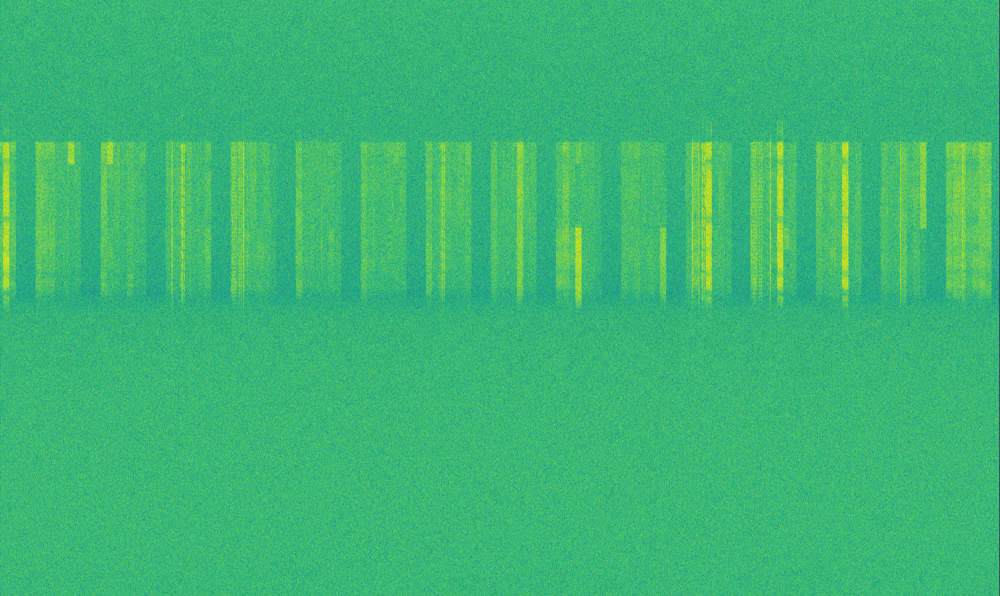

In [11]:
i = 10
augment_spectrogram(
    sample_1=master_meta[i],                            # Input signal metadata from master_meta list at index i
    sample_2=None,                                      # No second signal to mix (set to None for single signal processing)
    spectrogram_normalize=minmax_normalize_spectrogram, # Function to normalize spectrogram values (min-max scaling) not important when sample_2 is None
    signal_normalize=normalize_complex_signal,          # Function to normalize complex signal values not important when sample_2 is None
    shift_amount_hz_1=None,                             # No frequency shift applied to first signal
    shift_amount_hz_2=None,                             # No frequency shift applied to second signal (not used)
    signal_weight=0.0,                                  # Weight for mixing signals (not used since sample_2 is None)
    color_map_name='viridis',                           # Matplotlib colormap used for spectrogram visualization
    center_dc=False,                                    # Don't center the DC component (0 Hz) in the spectrogram
)

# Inference

In [1]:
import os
from glob import glob
import random

import ultralytics
from ultralytics import YOLO

# Check Ultralytics version
ultralytics.checks()

Ultralytics 8.3.156 🚀 Python-3.10.0 torch-2.7.1+cu126 CUDA:0 (NVIDIA GeForce RTX 4090, 24564MiB)
Setup complete ✅ (32 CPUs, 108.1 GB RAM, 477.7/1006.9 GB disk)


Make your test senerios based on recording names.
1. 5G and Video signals miss classification (Can be done right now) 5G, Unknown_Video
2. Test on no_drone enviremonets (Can be done right now) what files does qualify for this? (Environmental_signals)
3. Drone that it hasn't seen before (Autel X) FreeFlight
4. DJI drones (already done) DJI

In [15]:
len(master_meta)

16635

In [6]:
wifi_and_video_signals = []
for sample in master_meta:
    if sample['device'] == '5G':
        wifi_and_video_signals.append(sample)
    elif 'unknown_video' in sample['device'].lower():
        wifi_and_video_signals.append(sample)

alta_signals = []
for sample in master_meta:
    if 'alta' in sample['device'].lower():
        alta_signals.append(sample)

env_signals = []
for sample in master_meta:
    if 'environment' in sample['device'].lower():
        env_signals.append(sample)

dji_signals = []
for sample in master_meta:
    if 'dji' in sample['device'].lower():
        dji_signals.append(sample)

print(f"Total samples: {len(master_meta)}")
print(f"Samples with WiFi and Video signals: {len(wifi_and_video_signals)}")
print(f"Samples with Alta signals: {len(alta_signals)}")
print(f"Samples with Environment signals: {len(env_signals)}")
print(f"Samples with DJI signals: {len(dji_signals)}")
print(f"Sum of all samples: {len(wifi_and_video_signals) + len(alta_signals) + len(env_signals) + len(dji_signals)}")

Total samples: 16635
Samples with WiFi and Video signals: 5852
Samples with Alta signals: 2290
Samples with Environment signals: 6842
Samples with DJI signals: 1651
Sum of all samples: 16635


In [17]:
dji_signals[0]

{'device': 'DJI_Mini3',
 'status': 'flying',
 'env': 'Metlife_no_event',
 'sdr_gain': 76,
 'splitter': 'Y',
 'recording_duration': 5,
 'distance': 300,
 'altitude': 20,
 'center_freq': 2426.5,
 'drone_center_freq': 2412.5,
 'bandwidth': 10000000,
 'SNR': 14.0,
 'sampling_rate': 20000000,
 'timestamp': '13:28:42.644434',
 'original_file_path': '../dataset/Relate work from AeroDefense/Data/Raw data/site_survey_recording/2025-07-02/Metlife_no_event_76_20_5_Y_13 28 42.644434/DJI_Mini3_2426.5_10_2412.5_20_300_flying_14.dat',
 'device_2': None,
 'center_freq_2': None,
 'drone2_center_freq': None,
 'bandwidth_2': None,
 'SNR_2': None,
 'sampling_rate_2': None,
 'dat_file_path': '/mnt/d/Rowan/AeroDefence/dataset/Relate work from AeroDefense/Data/Raw data/site_survey_recording/2025-07-02/Metlife_no_event_76_20_5_Y_13 28 42.644434/DJI_Mini3_2426.5_10_2412.5_20_300_flying_14.dat',
 'start_index': 0,
 'end_index': 10000000,
 'time_start_sec': 0.0,
 'time_end_sec': 0.5,
 'fft_size': 1024,
 'num_fft

In [39]:
dji_signals[i]['center_freq']

2426.5

/mnt/d/Rowan/AeroDefence/dataset/Relate work from AeroDefense/Data/Raw data/site_survey_recording/2025-07-02/Metlife_no_event_76_20_5_Y_13 28 42.644434/DJI_Mini3_2426.5_10_2420.5_20_300_flying_14.dat


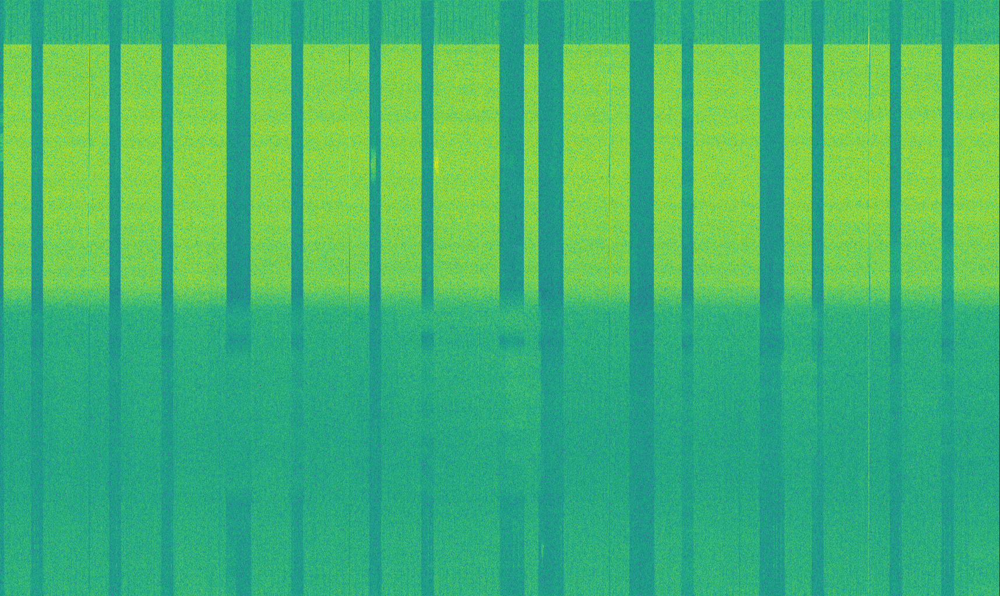

In [43]:
i = 190
print(dji_signals[i]['dat_file_path'])
augment_annotations(
    sample_1=dji_signals[i],
    sample_2=None,
    spectrogram_normalize=minmax_normalize_spectrogram,
    signal_normalize=None,
    # shift_amount_hz_1=(dji_signals[i]['center_freq'] - dji_signals[i]['drone_center_freq'])*1e6,
    shift_amount_hz_1=None,
    shift_amount_hz_2=None,
    signal_weight=0.5,
    color_map_name='viridis',
    center_dc=False,
)

In [ ]:
set([meta['device'] for meta in master_meta])

In [19]:
def var_name(var, scope):
    return [name for name in scope if scope[name] is var]

def create_folder(folder_path: str) -> None:
    """
    Creates a folder if it does not exist.

    Args:
        folder_path (str): Path to the folder to create.
    """
    if not os.path.exists(folder_path):
        os.makedirs(folder_path)
        print(f"Created folder: {folder_path}")

def save_png(
    image: Image,
    output_path: str,
    file_name: str,
    folder_name: str = 'images'
) -> None:
    """
    Saves a PIL Image as a PNG file.

    Args:
        image (Image): The PIL Image to save.
        output_path (str): The base path where the image will be saved.
        file_name (str): The name of the file to save the image as.
        folder_name (str): The name of the folder to save the image in.
    """
    create_folder(os.path.join(output_path, folder_name))
    full_path = os.path.join(output_path, folder_name, f"{file_name}.png")
    image.save(full_path)
    # print(f"Saved image to {full_path}")

In [20]:
import random
output_path = '../dataset/MLS/'
for meta_samples in [
    # wifi_and_video_signals, alta_signals, env_signals, 
    dji_signals]:
    folder_name = f'{var_name(meta_samples, locals())[0]}_no_shift'
    selected_samples = random.sample(meta_samples, min(1000, len(meta_samples)))
    for sample in tqdm(selected_samples):
        image = augment_annotations(
            sample_1=sample,
            sample_2=None,
            spectrogram_normalize=minmax_normalize_spectrogram,
            signal_normalize=normalize_complex_signal,
            shift_amount_hz_1=None,
            # shift_amount_hz_1=None,
            shift_amount_hz_2=None,
            signal_weight=1.0,
            color_map_name='viridis'
            )
        save_png(
            image=image,
            output_path=output_path,
            file_name=f"{os.path.basename(sample['dat_file_path'])[:-4]}_{sample['start_index']}_{sample['end_index']}_no_shift",
            folder_name=folder_name
        )

    # model = YOLO(f'./yolo/{model_type}/weights/best.pt') # Using yolov11n as an example
    # pred = model.predict(source=images, show=False, save=True, conf=0.25, save_txt=True, project=project_name, name=f'first_1500_{model_type}', exist_ok=True, stream=False)

    # with open(os.path.join(project_name, f'first_1500_{model_type}', 'pred.pkl'), 'wb') as f:
    #     pickle.dump(pred, f)

  0%|          | 0/1000 [00:00<?, ?it/s]

Created folder: ../dataset/MLS/dji_signals_no_shift


100%|██████████| 1000/1000 [08:58<00:00,  1.86it/s]


In [ ]:
# images = glob(os.path.join('../data/Relate work from AeroDefense/Data/Raw data/site_survey_recording_spectrogram','**', '*.jpg'), recursive=True)

images = []
images_metadata = []
for _ in range(512):
    i = random.randint(0, len(master_meta) - 1)
    images_metadata.append(master_meta[i])
    images.append(
        augment_annotations(
        sample_1=master_meta[i],
        sample_2=None,
        spectrogram_normalize=minmax_normalize_spectrogram,
        signal_normalize=normalize_complex_signal,
        shift_amount_hz_1=(master_meta[i]['center_freq'] - master_meta[i]['drone_center_freq'])*1e6,
        # shift_amount_hz_1=None,
        shift_amount_hz_2=None,
        signal_weight=0.5,
        color_map_name='viridis'
        )
    )
len(images)

In [ ]:
len(set([images_metadata[i]['original_file_path'] for i in range(512)]))

# Class Probabilities

In [1]:
import ultralytics
from ultralytics import YOLO

from src.yolo import class_probabilities
from src.yolo.utils import draw_detections

In [20]:
model_path = '../exp/yolo/detect/augmented_run1/'
model = YOLO(f'{model_path}/weights/best.pt') # Using yolov11n as an example
image_path = '../dataset/MLS/dji_signals_no_shift/DJI_Mini3_2412.5_10_2418.5_1_5_on_the_ground_10_54000000_64000000_no_shift.png'
pred = model.predict(source=image_path, show=False, save=True, conf=0.25, save_txt=False, project='yolo/random_dji', name='prob', exist_ok=True, stream=False)


image 1/1 /mnt/d/Rowan/AeroDefence/notebooks/../dataset/MLS/dji_signals_no_shift/DJI_Mini3_2412.5_10_2418.5_1_5_on_the_ground_10_54000000_64000000_no_shift.png: 384x640 2 Mini3s, 2 Tellos, 22.7ms
Speed: 1.8ms preprocess, 22.7ms inference, 4.5ms postprocess per image at shape (1, 3, 384, 640)
Results saved to yolo/random_dji/prob


Tello 0.95 P:0.95
Mini3 0.71 P:0.71
Mini3 0.91 P:0.91
Tello 0.36 P:0.36

--- Detailed Class Probabilities per Detection ---

Detection 1 (Predicted: 'Tello'):
  - 2: 0.0004
  - Anafi: 0.0000
  - EXOII: 0.0000
  - F11GIM: 0.0005
  - FPV: 0.0001
  - HS110G: 0.0002
  - HS720E: 0.0001
  - Inspire1: 0.0000
  - KY601S: 0.0002
  - Mavic2Pro: 0.0002
  - Mavic3: 0.0000
  - MavicAir: 0.0000
  - MavicMini4: 0.0002
  - MavicPro: 0.0019
  - Mini3: 0.0029
  - Phantom4: 0.0000
  - PhantomAdv3: 0.0002
  - Tello: 0.9457
  - X4: 0.0000
  - Xstar: 0.0005

Detection 2 (Predicted: 'Mini3'):
  - 2: 0.0001
  - Anafi: 0.0000
  - EXOII: 0.0000
  - F11GIM: 0.0003
  - FPV: 0.0001
  - HS110G: 0.0011
  - HS720E: 0.0000
  - Inspire1: 0.0000
  - KY601S: 0.0001
  - Mavic2Pro: 0.0001
  - Mavic3: 0.0002
  - MavicAir: 0.0000
  - MavicMini4: 0.0004
  - MavicPro: 0.0017
  - Mini3: 0.9077
  - Phantom4: 0.0000
  - PhantomAdv3: 0.0001
  - Tello: 0.0001
  - X4: 0.0000
  - Xstar: 0.0000

Detection 3 (Predicted: 'Mini3'):
  - 2

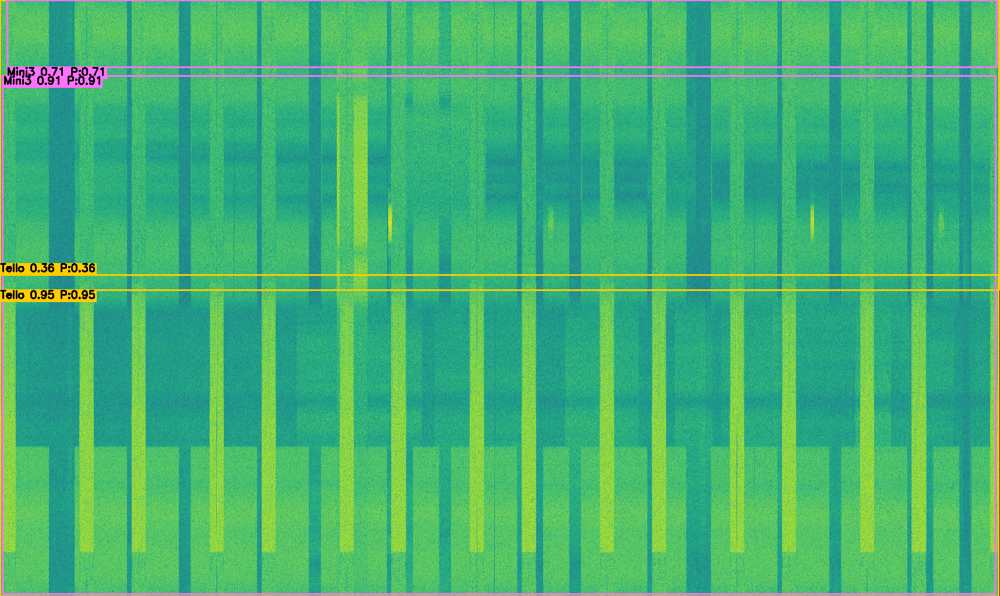

In [21]:
from IPython.display import display, Image
import cv2

results = pred[0]
# Load the original image
original_image = cv2.imread(image_path)

# Draw the detections
annotated_image = draw_detections(original_image, results)

# 1. Encode the image to a memory buffer
_, buffer = cv2.imencode('.png', annotated_image)

# 2. Create an IPython Image object and display it
display(Image(data=buffer.tobytes()))

In [3]:
pred[0].boxes.probs

tensor([[4.0600e-04, 7.0081e-06, 3.1180e-05, 5.2991e-04, 1.4649e-04, 2.2835e-04, 1.0070e-04, 3.1528e-05, 1.5364e-04, 2.2658e-04, 3.3956e-06, 7.0381e-06, 1.9648e-04, 1.9061e-03, 2.8669e-03, 2.7053e-05, 1.7266e-04, 9.4571e-01, 3.1678e-07, 5.4716e-04],
        [5.3174e-05, 1.5250e-05, 4.2456e-05, 3.0335e-04, 1.1468e-04, 1.0522e-03, 2.5340e-05, 3.1028e-05, 1.1751e-04, 1.0957e-04, 1.8685e-04, 1.3006e-05, 4.0309e-04, 1.6752e-03, 9.0773e-01, 1.2485e-05, 1.4041e-04, 6.2102e-05, 1.1316e-05, 1.9633e-06],
        [2.2581e-04, 2.3425e-05, 1.3872e-05, 2.5029e-04, 2.0503e-05, 2.0842e-03, 8.0530e-05, 2.4677e-04, 1.6559e-03, 6.2600e-05, 5.6101e-05, 1.2630e-05, 1.1665e-02, 1.9009e-03, 7.0940e-01, 4.5995e-05, 1.6930e-05, 1.1167e-04, 7.2957e-06, 5.6207e-06],
        [1.9892e-04, 3.4080e-04, 5.2825e-06, 1.6872e-04, 4.4936e-04, 2.9314e-04, 2.8003e-04, 7.7021e-04, 3.9794e-03, 1.0633e-04, 1.4483e-05, 6.9195e-06, 1.5647e-03, 2.5441e-02, 3.6967e-03, 2.4578e-05, 2.8671e-05, 3.5600e-01, 4.7593e-06, 8.1592e-05]],

In [7]:
len(pred)

1

In [9]:
pred[0].boxes[0].probs

AttributeError: 'Boxes' object has no attribute 'probs'. See valid attributes below.

    A class for managing and manipulating detection boxes.

    This class provides comprehensive functionality for handling detection boxes, including their coordinates,
    confidence scores, class labels, and optional tracking IDs. It supports various box formats and offers
    methods for easy manipulation and conversion between different coordinate systems.

    Attributes:
        data (torch.Tensor | numpy.ndarray): The raw tensor containing detection boxes and associated data.
        orig_shape (Tuple[int, int]): The original image dimensions (height, width).
        is_track (bool): Indicates whether tracking IDs are included in the box data.
        xyxy (torch.Tensor | numpy.ndarray): Boxes in [x1, y1, x2, y2] format.
        conf (torch.Tensor | numpy.ndarray): Confidence scores for each box.
        cls (torch.Tensor | numpy.ndarray): Class labels for each box.
        id (torch.Tensor | None): Tracking IDs for each box (if available).
        xywh (torch.Tensor | numpy.ndarray): Boxes in [x, y, width, height] format.
        xyxyn (torch.Tensor | numpy.ndarray): Normalized [x1, y1, x2, y2] boxes relative to orig_shape.
        xywhn (torch.Tensor | numpy.ndarray): Normalized [x, y, width, height] boxes relative to orig_shape.

    Methods:
        cpu: Return a copy of the object with all tensors on CPU memory.
        numpy: Return a copy of the object with all tensors as numpy arrays.
        cuda: Return a copy of the object with all tensors on GPU memory.
        to: Return a copy of the object with tensors on specified device and dtype.

    Examples:
        >>> import torch
        >>> boxes_data = torch.tensor([[100, 50, 150, 100, 0.9, 0], [200, 150, 300, 250, 0.8, 1]])
        >>> orig_shape = (480, 640)  # height, width
        >>> boxes = Boxes(boxes_data, orig_shape)
        >>> print(boxes.xyxy)
        >>> print(boxes.conf)
        >>> print(boxes.cls)
        >>> print(boxes.xywhn)
    

In [14]:
# Assuming 'pred' is the output from your model.predict() call
if pred and pred[0]:
    results = pred[0]
    boxes = results.boxes      # Your patched Boxes object
    class_names = results.names  # Class names map, e.g., {0: 'person', 1: 'car'}

    if boxes is not None:
        print("--- Detections ---")
        # Iterate through each detected box
        for box in boxes:
            # Each 'box' is a Boxes object with a single detection
            class_index = int(box.cls)
            class_name = class_names[class_index]
            confidence = float(box.conf)

            # Print the class name and confidence formatted to 4 decimal places
            print(f"{class_name}: {confidence:.4f}")
    else:
        print("No detections found in the image.")

    # This code builds on the previous snippet
    if boxes is not None and boxes.format == 'xyxy_conf_cls_classconf':
        print("\n--- Detailed Class Probabilities per Detection ---")
        for i, box_data in enumerate(boxes.data):
            predicted_class_index = int(box_data[5])
            print(f"\nDetection {i+1} (Predicted: '{class_names[predicted_class_index]}'):")
            
            # The class probabilities start from column index 6
            all_class_probs = box_data[6 : 6 + boxes.num_classes]
            
            for cls_idx, prob in enumerate(all_class_probs):
                class_name = class_names[cls_idx]
                print(f"  - {class_name}: {prob:.4f}")

else:
    print("Prediction returned no results.")


--- Detections ---
Tello: 0.9457
Mini3: 0.9077
Mini3: 0.7094
Tello: 0.3560

--- Detailed Class Probabilities per Detection ---

Detection 1 (Predicted: 'Tello'):
  - 2: 0.0004
  - Anafi: 0.0000
  - EXOII: 0.0000
  - F11GIM: 0.0005
  - FPV: 0.0001
  - HS110G: 0.0002
  - HS720E: 0.0001
  - Inspire1: 0.0000
  - KY601S: 0.0002
  - Mavic2Pro: 0.0002
  - Mavic3: 0.0000
  - MavicAir: 0.0000
  - MavicMini4: 0.0002
  - MavicPro: 0.0019
  - Mini3: 0.0029
  - Phantom4: 0.0000
  - PhantomAdv3: 0.0002
  - Tello: 0.9457
  - X4: 0.0000
  - Xstar: 0.0005

Detection 2 (Predicted: 'Mini3'):
  - 2: 0.0001
  - Anafi: 0.0000
  - EXOII: 0.0000
  - F11GIM: 0.0003
  - FPV: 0.0001
  - HS110G: 0.0011
  - HS720E: 0.0000
  - Inspire1: 0.0000
  - KY601S: 0.0001
  - Mavic2Pro: 0.0001
  - Mavic3: 0.0002
  - MavicAir: 0.0000
  - MavicMini4: 0.0004
  - MavicPro: 0.0017
  - Mini3: 0.9077
  - Phantom4: 0.0000
  - PhantomAdv3: 0.0001
  - Tello: 0.0001
  - X4: 0.0000
  - Xstar: 0.0000

Detection 3 (Predicted: 'Mini3'):
  

In [ ]:
image_preds = []
for i in range(len(images_metadata)):
    pred_ids = pred[i].boxes.cls.detach().cpu().numpy()
    pred_name = [pred[i].names[pred_ids[j]] for j in range(len(pred_ids)) if pred[i].boxes.conf[j] > 0.6]
    image_preds.append(pred_name)

image_preds

In [ ]:
image_gts = [meta['label'] for meta in images_metadata]
image_gts

In [ ]:
def str_in_list(target_str: str, str_list: list[str]) -> bool:
    for s in str_list:
        if target_str in s:
            return True
    return False

acc= 0 
extra_acc = 0
miss_acc = 0
for i in range(512):
    if_1_already = False
    if_2_already = False
    for pred_str in image_preds[i]:
        if str_in_list(pred_str, image_gts[i]):
            # if if_1_already==False:
            #     acc += 1
            #     if_1_already = True
            # else:
            #     extra_acc += 1
            acc += 1
        elif pred_str == 'MavicPro' and str_in_list('DJI_Mavic_2', image_gts[i]):
            # if if_2_already==False:
            #     acc += 1
            #     if_2_already = True
            # else:
            #     extra_acc += 1
            acc += 1
        else:
            miss_acc += 1

acc/1024
(miss_acc+extra_acc)/1024

In [ ]:
no_drone = [i for i in range(512) if len(image_preds[i])==0]

In [ ]:
len(no_drone)

In [ ]:
miss_acc

In [ ]:
acc/1024


In [45]:
import os

os.listdir('../dataset/unannotated_cage_dataset/images')

['Autel_EXOII',
 'Autel_Xstar',
 'DJI_FPV',
 'DJI_FPV_DJI_Mavic3',
 'DJI_FPV_DJI_Mini3',
 'DJI_Inspire1',
 'DJI_Inspire2',
 'DJI_Mavic2Pro',
 'DJI_Mavic3',
 'DJI_MavicAir',
 'DJI_MavicMini4',
 'DJI_MavicPro',
 'DJI_Mini3',
 'DJI_Mini3_DJI_Mavic3',
 'DJI_Phantom4',
 'DJI_PhantomAdv3',
 'DJI_Tello',
 'HollyStone_HS110G',
 'Holystone_HS720E',
 'Hubsan_X4_Air',
 'Laptop_Wi-Fi_video',
 'meta_data.json',
 'NoDrone',
 'old_meta_data.json',
 'Parrot_Anafi',
 'Quadcopter_KY601S',
 'RadioMaster_TX16S',
 'Ruko_F11GIM',
 'Skydio_2',
 'Yuneec_Q500-HD']

In [ ]:
import os

os.listdir('../dataset/unannotated_cage_dataset/images')

['Autel_EXOII',
 'Autel_Xstar',
 'DJI_FPV',
 'DJI_FPV_DJI_Mavic3',
 'DJI_FPV_DJI_Mini3',
 'DJI_Inspire1',
 'DJI_Inspire2',
 'DJI_Mavic2Pro',
 'DJI_Mavic3',
 'DJI_MavicAir',
 'DJI_MavicMini4',
 'DJI_MavicPro',
 'DJI_Mini3',
 'DJI_Mini3_DJI_Mavic3',
 'DJI_Phantom4',
 'DJI_PhantomAdv3',
 'DJI_Tello',
 'HollyStone_HS110G',
 'Holystone_HS720E',
 'Hubsan_X4_Air',
 'Laptop_Wi-Fi_video',
 'meta_data.json',
 'NoDrone',
 'old_meta_data.json',
 'Parrot_Anafi',
 'Quadcopter_KY601S',
 'RadioMaster_TX16S',
 'Ruko_F11GIM',
 'Skydio_2',
 'Yuneec_Q500-HD']

In [ ]:
import os

os.listdir('../dataset/unannotated_cage_dataset/images')

['Autel_EXOII',
 'Autel_Xstar',
 'DJI_FPV',
 'DJI_FPV_DJI_Mavic3',
 'DJI_FPV_DJI_Mini3',
 'DJI_Inspire1',
 'DJI_Inspire2',
 'DJI_Mavic2Pro',
 'DJI_Mavic3',
 'DJI_MavicAir',
 'DJI_MavicMini4',
 'DJI_MavicPro',
 'DJI_Mini3',
 'DJI_Mini3_DJI_Mavic3',
 'DJI_Phantom4',
 'DJI_PhantomAdv3',
 'DJI_Tello',
 'HollyStone_HS110G',
 'Holystone_HS720E',
 'Hubsan_X4_Air',
 'Laptop_Wi-Fi_video',
 'meta_data.json',
 'NoDrone',
 'old_meta_data.json',
 'Parrot_Anafi',
 'Quadcopter_KY601S',
 'RadioMaster_TX16S',
 'Ruko_F11GIM',
 'Skydio_2',
 'Yuneec_Q500-HD']

In [ ]:
import os

os.listdir('../dataset/unannotated_cage_dataset/images')

['Autel_EXOII',
 'Autel_Xstar',
 'DJI_FPV',
 'DJI_FPV_DJI_Mavic3',
 'DJI_FPV_DJI_Mini3',
 'DJI_Inspire1',
 'DJI_Inspire2',
 'DJI_Mavic2Pro',
 'DJI_Mavic3',
 'DJI_MavicAir',
 'DJI_MavicMini4',
 'DJI_MavicPro',
 'DJI_Mini3',
 'DJI_Mini3_DJI_Mavic3',
 'DJI_Phantom4',
 'DJI_PhantomAdv3',
 'DJI_Tello',
 'HollyStone_HS110G',
 'Holystone_HS720E',
 'Hubsan_X4_Air',
 'Laptop_Wi-Fi_video',
 'meta_data.json',
 'NoDrone',
 'old_meta_data.json',
 'Parrot_Anafi',
 'Quadcopter_KY601S',
 'RadioMaster_TX16S',
 'Ruko_F11GIM',
 'Skydio_2',
 'Yuneec_Q500-HD']